<a href="https://colab.research.google.com/github/ganeevsingh18/CV_assignment1/blob/main/q3_2021389_HW1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. Importing Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os, csv

Helper function if there are duplicates, I used it at the start

In [ ]:
%%script echo skipping
# import re



# for path in image_files:
#     # Use regular expression to extract the text between the last '/' and '.jpg'
#     match = re.search(r'[^/]+(?=\.jpg$)', path)
#     if match:
#         extracted_text = match.group(0)
#         if ' ' in extracted_text:
#           os.remove(path)






skipping



#3 1 a) Downloading Dataset

I extracted the files into my drive from the given drive, There are 2 folders: images and masks

I have put them into 2 different lists image_files and masks_files each containing paths of list
If i sort them and go index by index, I'll get [image path,mask path]

In [ ]:
#creating a csv that contains: [image path, mask path]
image_folder='/content/drive/MyDrive/cv idd dataset/image_archive'
mask_folder='/content/drive/MyDrive/cv idd dataset/mask_archive'

def list_files(directory):
  return [os.path.join(directory,f) for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]


In [ ]:
image_files = sorted(list_files(image_folder))
mask_files = sorted(list_files(mask_folder))

In [ ]:
print(len(mask_files))
print(len(image_files))

6982
6982


In [ ]:

from PIL import Image
import numpy as np


In [ ]:
import random

# Set a seed for reproducibility
random.seed(42)

# Pair image files with their mask files in a list of dictionaries
paired_data = [[image, mask] for image, mask in zip(image_files, mask_files)]


# Calculate the number of samples for 30% of the data
num_samples = int(len(paired_data) * 0.3)

# Randomly select 30% of the paired data
random_dataset = random.sample(paired_data, num_samples)



In [ ]:
print(len(random_dataset))

2094


In [ ]:
print(random_dataset[0])

['/content/drive/MyDrive/cv idd dataset/image_archive/image_5712.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_5712.jpg']


NOTE TO SELF:
I have image and masks
Image is a height*width*3*256

height* width

width= pixels*width

pixel=[R,G,B] each with value (0,256)



The mask is an image but rather than [R,G,B] it contains [class]

which is numbered 0-25 (aka 26 classes)


In [ ]:
image=Image.open(image_files[0])
image_array=np.array(image)
print(image_array)
print(np.ptp(image_array))

[[[ 37  52  13]
  [ 39  54  15]
  [ 35  50  11]
  ...
  [246 255 254]
  [247 255 255]
  [247 255 255]]

 [[ 38  53  14]
  [ 41  56  17]
  [ 37  52  13]
  ...
  [247 255 255]
  [247 255 255]
  [247 255 255]]

 [[ 41  58  16]
  [ 42  59  17]
  [ 36  52  13]
  ...
  [247 255 255]
  [247 255 255]
  [247 255 255]]

 ...

 [[120 125 119]
  [119 124 118]
  [121 123 120]
  ...
  [119 120 115]
  [119 120 115]
  [119 120 115]]

 [[120 125 119]
  [120 125 119]
  [121 123 120]
  ...
  [120 121 116]
  [119 120 115]
  [119 120 115]]

 [[119 124 118]
  [119 124 118]
  [120 122 119]
  ...
  [119 120 115]
  [119 120 115]
  [119 120 115]]]
255


In [ ]:

mask=Image.open(mask_files[0])
mask_array= np.array(mask)

print(mask_array)

print(np.ptp(mask_array))

[[24 24 24 ... 25 25 25]
 [24 24 24 ... 25 25 25]
 [24 24 24 ... 25 25 25]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]
25


In [ ]:
toy_images=image_files[0:50]
print(toy_images)

['/content/drive/MyDrive/cv idd dataset/image_archive/image_0.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_10.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_100.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1000.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1001.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1002.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1003.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1004.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1005.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1006.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1007.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1008.jpg', '/content/drive/MyDrive/cv idd dataset/image_archive/image_1009.jpg', '/content/drive/MyDrive/cv i

In [ ]:
toy_masks=mask_files[0:50]
print(toy_masks)

['/content/drive/MyDrive/cv idd dataset/mask_archive/mask_0.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_10.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_100.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1000.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1001.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1002.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1003.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1004.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1005.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1006.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1007.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1008.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_1009.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask

#3 1 b) Data Distribution across provided dataset

Taking the computational power in mind, I am creating a toy_images dataset of just 50 images
I'll scale when using GPU

I have created the dictionary, mapping between class_numbers and classes by refering to image of ids
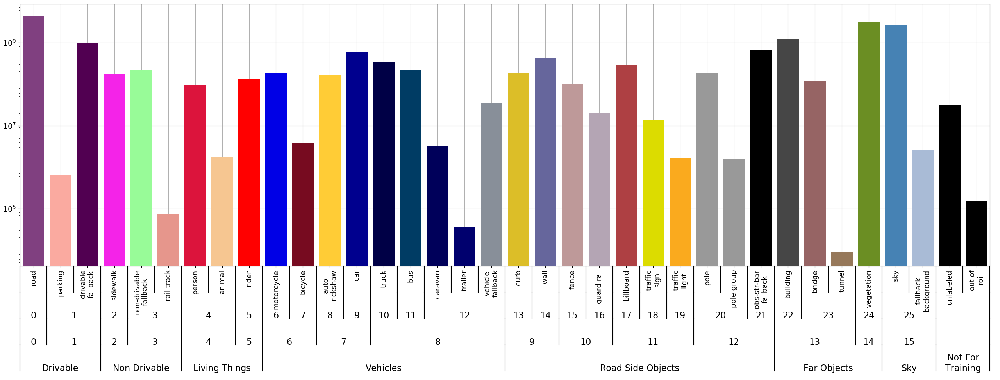

In [ ]:
# Create a dictionary to map class labels to their names
class_names = {
    0: "Road",1: "Parking/Drivable fallback", 2: "Sidewalk", 3: "Non-Drivable Fallback", 4: "Person", 5: "Rider", 6: "Motorbike", 7: "Bicycle",
    8:"Auto Rikshaw", 9: "Car", 10: "Truck", 11: "Bus", 12: "Train",13:"Curb", 14: "Wall", 15: "Fence",16:"Gaurd rail",17:"Billboard", 18: "Traffic Sign",
    19: "Traffic Light", 20: "Pole",21:"Obs-str fallback", 22: "Building", 23: "Bridge", 24: "Vegetation", 25: "Sky",
    26: "Out of ROI"
}


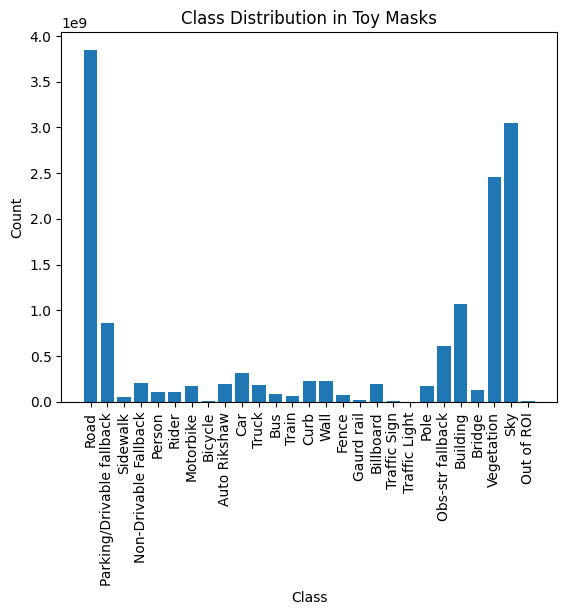

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Assume toy_masks is a list containing paths to image files


# Initialize an empty dictionary to store class counts
class_counts = {class_name: 0 for class_name in class_names.values()}


for mask_path in mask_files:

    mask = np.array(Image.open(mask_path))

    # Replace labels greater than 25 with 26 (Out of ROI)
    mask = np.where(mask > 25, 26, mask)
    flat_mask = mask.ravel()
    unique, counts = np.unique(flat_mask, return_counts=True)
    for label, count in zip(unique, counts):
        class_counts[class_names[label]] += count

# Plot histogram
plt.bar(class_counts.keys(), class_counts.values())
plt.xticks(rotation=90)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution in Toy Masks')
plt.show()


#3 1 c) Visualize 2 images along with their masks for each class

# if 3 c) means per class

In [ ]:
%%script echo skip
import cv2
import numpy as np


class_images = {class_id: [] for class_id in class_names.keys()}


for image_file, mask_file in zip(image_files, mask_files):

    mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)


    max_val = np.max(mask)


    if max_val in class_images and len(class_images[max_val]) < 2:

        class_images[max_val].append(image_file)

# Filter out classes that have no images
class_images = {class_id: images for class_id, images in class_images.items() if images}


skip


I have color coded first using grayscale then using rgb
the function visualize

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def visualize_segmentation(image_path, mask_path):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    mask = cv2.resize(mask, (image.shape[1], image.shape[0]))

    masked_image = cv2.bitwise_and(image, image, mask=mask)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')

    axes[1].imshow(mask, cmap='jet')  # Change the colormap to 'jet'
    axes[1].set_title('Mask')

    axes[2].imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Masked Image')

    plt.show()





In [ ]:
#let 2 images be the first 2 images of dataset
first_image=[image_files[0],mask_files[0]]
second_image=[image_files[10],mask_files[10]]

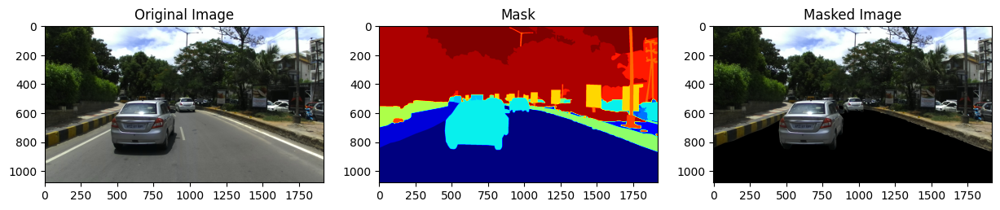

In [ ]:
visualize_segmentation(image_files[0],mask_files[0])

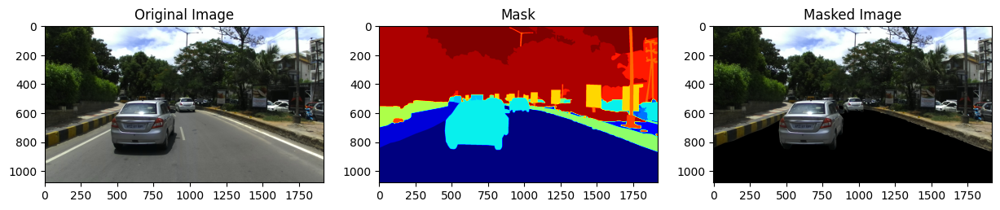

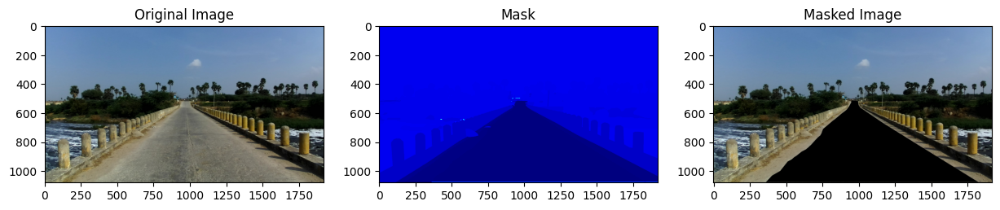

In [ ]:
visualize_segmentation(first_image[0],first_image[1])
visualize_segmentation(second_image[0],second_image[1])

In [ ]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision.models.segmentation import deeplabv3_resnet101

In [ ]:
#creating a tesset of paths,
import random

random.seed(42)

random_indices = random.sample(range(len(image_files)), 50)

random_image_files = []
random_mask_files = []

for index in random_indices:
    random_image_files.append(image_files[index])
    random_mask_files.append(mask_files[index])

In [ ]:
random_toy_dataset=[]
for i in range(0,50):
  random_toy_dataset.append([random_image_files[i],random_mask_files[i]])

#REMEMBER

#3 2 a) Using a Pre-Trained DeepLabv3Plus-Pytorch model

In [ ]:
!git clone https://github.com/VainF/DeepLabV3Plus-Pytorch.git


Cloning into 'DeepLabV3Plus-Pytorch'...
remote: Enumerating objects: 705, done.
remote: Counting objects: 100% (52/52), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 705 (delta 25), reused 30 (delta 14), pack-reused 653
Receiving objects: 100% (705/705), 8.26 MiB | 45.73 MiB/s, done.
Resolving deltas: 100% (380/380), done.


In [ ]:
import sys
sys.path.append("/content/DeepLabV3Plus-Pytorch")

In [ ]:
import sys
print(sys.path)

['/content', '/env/python', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '', '/usr/local/lib/python3.10/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.10/dist-packages/IPython/extensions', '/root/.ipython', '/content/DeepLabV3Plus-Pytorch']


In [ ]:
!wget -O model.pth "https://www.dropbox.com/sh/w3z9z8lqpi8b2w7/AAB0vkl4F5vy6HdIhmRCTKHSa?dl=0&e=2&preview=best_deeplabv3plus_mobilenet_cityscapes_os16.pth"

--2024-02-22 04:27:59--  https://www.dropbox.com/sh/w3z9z8lqpi8b2w7/AAB0vkl4F5vy6HdIhmRCTKHSa?dl=0&e=2&preview=best_deeplabv3plus_mobilenet_cityscapes_os16.pth
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /sh/raw/w3z9z8lqpi8b2w7/AAB0vkl4F5vy6HdIhmRCTKHSa [following]
--2024-02-22 04:28:00--  https://www.dropbox.com/sh/raw/w3z9z8lqpi8b2w7/AAB0vkl4F5vy6HdIhmRCTKHSa
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc0d0b97f3f816d8266004ed6b50.dl.dropboxusercontent.com/zip_download_get/BxLsuklTAkDNuiWiQiQGlN343n1zP6EpsIuChYluJQCS7aUqqSPC4FX3jJgZh-dYqE9ybRlTs9GAnKC_fjDq4HH0b8wM3ehUl1sh05CGEcB4Dw# [following]
--2024-02-22 04:28:00--  https://uc0d0b97f3f816d8266004ed6b50.dl.dropboxusercontent.com/zip_download_get/BxLsuklTAkDNuiWiQiQGlN343n1zP6E

In [ ]:
from network import modeling



In [ ]:
from datasets import Cityscapes

In [ ]:
model = modeling.__dict__['deeplabv3plus_mobilenet'](num_classes=19, output_stride=16)


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 69.7MB/s]


In [ ]:
import torch
import torch.utils.data as data
from torch.utils.data import DataLoader
import glob
import os
from PIL import Image
import re
from torchvision import transforms as T
from matplotlib import pyplot as plt
import numpy as np
import cv2
import random


In [ ]:
print(model)

In [ ]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA is available. Using GPU.")
else:
    device = torch.device("cpu")
    print("CUDA is not available. Using CPU.")

CUDA is available. Using GPU.


In [ ]:
file_path = '/content/drive/MyDrive/pre_trained_model/best_deeplabv3plus_mobilenet_cityscapes_os16.pth'


In [ ]:
model = modeling.__dict__['deeplabv3plus_mobilenet'](num_classes=19, output_stride=16)
model.load_state_dict( torch.load( '/content/drive/MyDrive/pre_trained_model/best_deeplabv3plus_mobilenet_cityscapes_os16.pth' )['model_state']  )

<All keys matched successfully>

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader

In [ ]:
print(random_dataset[0])

['/content/drive/MyDrive/cv idd dataset/image_archive/image_5712.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_5712.jpg']


In [ ]:
import re

class CustomDataset(Dataset):
    def __init__(self, paired_data, transform=None):
        self.paired_data = paired_data
        self.transform = transform

    def __len__(self):
        return len(self.paired_data)

    def __getitem__(self, idx):
        image_path = self.paired_data[idx][0]
        mask_path = self.paired_data[idx][1]

        # Extract the index 'i' from the image path
        image_index = int(re.search(r'image_(\d+)\.jpg', image_path).group(1))

        # Load image and mask
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask, idx, image_index

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])



In [ ]:
batch_size=16

In [ ]:
dataset = CustomDataset(random_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

In [ ]:
import torch
import numpy as np
import cv2
import os
import shutil

# Define the mapping as a PyTorch tensor
colors_city = {
    0: 0,
    1: 2,
    11: 4,
    12: 5,
    17: 6,
    18: 7,
    13: 9,
    14: 10,
    15: 11,
    16: 12,
    3: 14,
    4: 15,
    7: 18,
    6: 19,
    5: 20,
    2: 22,
    8: 24,
    10: 25
}
max_key = max(colors_city.keys())
mapping_array = torch.full((max_key + 1,), 26, dtype=torch.long, device=device)  # Initialize with 26
for k, v in colors_city.items():
    mapping_array[k] = v

import torch
import numpy as np
import cv2
import os
import shutil

import torch
import numpy as np
import os
import shutil

import torch
import numpy as np
import os
import shutil

def save_transformed_predictions_to_drive(dataloader, model, device, save_dir, batch_size=100):
    model.eval()  # Set the model to evaluation mode
    local_save_path = '/content/local_predictions'
    drive_save_path = f'/content/drive/My Drive/{save_dir}'

    # Create the local directory if it doesn't exist
    if not os.path.exists(local_save_path):
        os.makedirs(local_save_path)

    with torch.no_grad():  # Disable gradient tracking for efficiency
        for batch_num, data in enumerate(dataloader):  # Iterate over the dataloader
            data_img = data[0].to(device)  # Assuming the first item is the image data
            image_indices = data[-1]  # Assuming the last item is the image indices

            # Make predictions and take the max across the class dimension
            pred = model(data_img).max(1)[1].cpu().numpy()

            # Transform the predictions based on the colors_city mapping
            # Note: Ensure mapping_array is defined and accessible in this scope
            pred_transformed = [mapping_array[p].cpu().numpy() for p in pred]

            # Save transformed predictions locally as .npy files
            for i, img_index in enumerate(image_indices):
                np.save(os.path.join(local_save_path, f'transformed_pred_{img_index.item()}.npy'), pred_transformed[i])

            # Transfer to Google Drive and delete local files after every batch_size images
            if (batch_num + 1) % batch_size == 0:
                if not os.path.exists(drive_save_path):
                    os.makedirs(drive_save_path)
                for file in os.listdir(local_save_path):
                    shutil.move(os.path.join(local_save_path, file), drive_save_path)
                print(f'Batch {batch_num + 1} saved to Google Drive')
                shutil.rmtree(local_save_path)  # Clear local save path after moving
                os.makedirs(local_save_path)  # Recreate the local directory

        # Transfer any remaining files to Google Drive
        if os.listdir(local_save_path):
            if not os.path.exists(drive_save_path):
                os.makedirs(drive_save_path)
            for file in os.listdir(local_save_path):
                shutil.move(os.path.join(local_save_path, file), drive_save_path)
            print('Final batch saved to Google Drive')
            shutil.rmtree(local_save_path)  # Clear local save path after moving

# Example usage
# save_transformed_predictions_to_drive(dataloader, model, device, 'predicted_masks', batch_size=25)




In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model=model.to('cuda')
save_transformed_predictions_to_drive(dataloader, model, device,'predicted masks', batch_size=25)

Batch 25 saved to Google Drive
Batch 50 saved to Google Drive
Batch 75 saved to Google Drive
Batch 100 saved to Google Drive
Batch 125 saved to Google Drive
Final batch saved to Google Drive


# 3 2 a) saved all the results in .npy file in my drive because of gpu constraints


In [ ]:
folder_path='/content/drive/MyDrive/predicted masks'
import pandas as pd

# Convert random_dataset to a DataFrame
df = pd.DataFrame(random_dataset, columns=['image', 'mask'])

# Specify the CSV file path
csv_file_path = f'{folder_path}/random_dataset.csv'

# Save the DataFrame as a CSV file
df.to_csv(csv_file_path, index=False)

In [ ]:
# making a small file to test shit
import os

folder_path = '/content/drive/MyDrive/predicted masks'  # Replace with your folder path
toy_predictions = []

# List all files in the folder
all_files = os.listdir(folder_path)

# Filter out .npy files and store the first 5 paths in toy_predictions
for file in all_files:
    if file.endswith('.npy'):
        toy_predictions.append(os.path.join(folder_path, file))
    if len(toy_predictions) == 5:
        break

print(toy_predictions)

['/content/drive/MyDrive/predicted masks/transformed_pred_4089.npy', '/content/drive/MyDrive/predicted masks/transformed_pred_6593.npy', '/content/drive/MyDrive/predicted masks/transformed_pred_4309.npy', '/content/drive/MyDrive/predicted masks/transformed_pred_4579.npy', '/content/drive/MyDrive/predicted masks/transformed_pred_6505.npy']


In [ ]:
folder_path = '/content/drive/MyDrive/predicted masks'  # Replace with your folder path
csv_file_path = '/content/drive/MyDrive/predicted masks/random_dataset.csv'  # Replace with your CSV file path

# List all .npy files in the folder
npy_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.npy')]

In [ ]:
import csv
csv_data = []

# Read the CSV file and store the data in a list of lists
with open(csv_file_path, mode='r') as file:
    csv_reader = csv.reader(file)
    for row in csv_reader:
        csv_data.append(row)

csv_data = csv_data[1:]

In [ ]:
npy_files=sorted(npy_files)
csv_data=sorted(csv_data)

In [ ]:
print(len(npy_files))

2094


In [ ]:
grouped_data = [[npy_file] + csv_row[:2] for npy_file, csv_row in zip(npy_files, csv_data)]

print(len(grouped_data))
print(grouped_data[0])


2094
['/content/drive/MyDrive/predicted masks/transformed_pred_100.npy', '/content/drive/MyDrive/cv idd dataset/image_archive/image_100.jpg', '/content/drive/MyDrive/cv idd dataset/mask_archive/mask_100.jpg']


In [ ]:
toy_dataset = grouped_data[:5]

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def view_images(data_list):
    for predicted_mask_path, image_path, actual_mask_path in data_list:
        predicted_mask = np.load(predicted_mask_path)
        image_file = cv2.imread(image_path)
        actual_mask = cv2.imread(actual_mask_path, cv2.IMREAD_GRAYSCALE)

        # Resize the image and actual mask to (512, 512)
        image_file = cv2.resize(image_file, (512, 512))
        actual_mask = cv2.resize(actual_mask, (512, 512), interpolation=cv2.INTER_NEAREST)

        # Convert BGR to RGB (OpenCV uses BGR by default)
        image_file = cv2.cvtColor(image_file, cv2.COLOR_BGR2RGB)

        # Display the images side by side
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(predicted_mask, cmap='viridis')  # Use a colormap for color blast
        plt.title('Predicted Mask (Color Blast)')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(image_file)
        plt.title('Image File (Resized)')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(actual_mask, cmap='viridis')  # Use a colormap for color blast
        plt.title('Actual Mask (Color Blast)')
        plt.axis('off')

        plt.show()







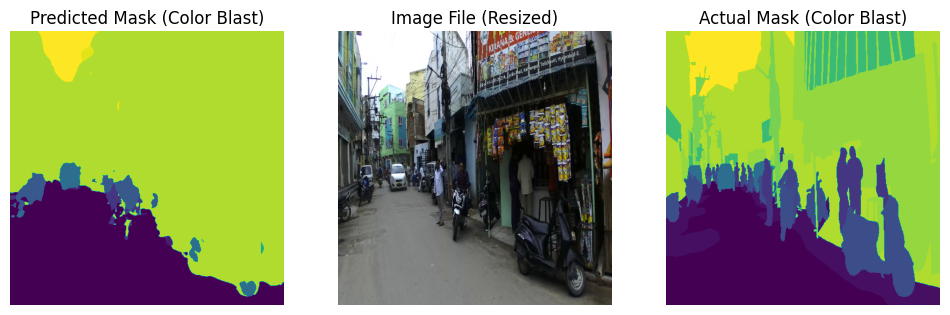

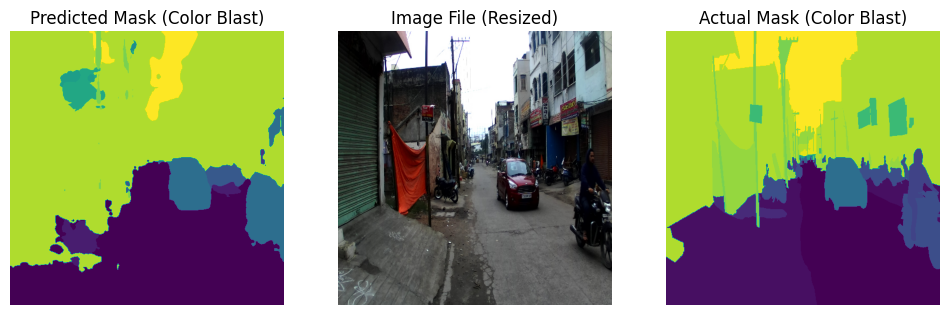

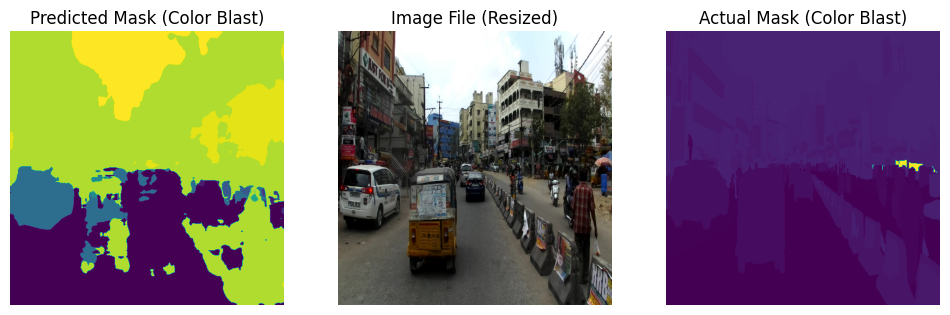

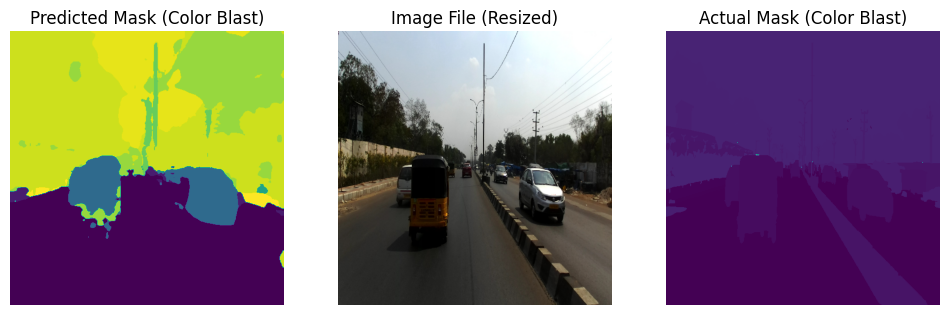

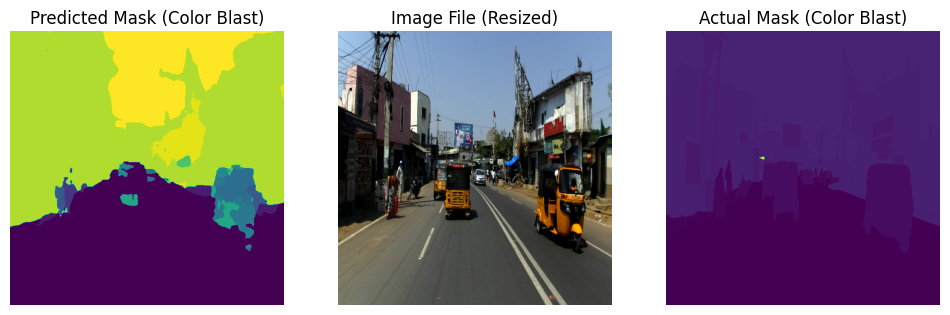

In [ ]:
view_images(toy_dataset)

# 3 2 b) Finding pixel-wise accuracy, dice coefficient, IoU

In [ ]:
import torch
import numpy as np
import cv2
from tqdm import tqdm



# Define the available classes based on the values of the colors_city dictionary
available_classes = list(set(colors_city.values()))

# IoU thresholds
iou_thresholds = np.arange(0, 1.1, 0.1)

# Initialize metrics
class_iou_scores = {c: {t: [] for t in iou_thresholds} for c in available_classes}
class_dice_scores = {c: {t: [] for t in iou_thresholds} for c in available_classes}
class_precisions = {c: {t: [] for t in iou_thresholds} for c in available_classes}
class_recalls = {c: {t: [] for t in iou_thresholds} for c in available_classes}

# Move computations to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Loop through the list and calculate metrics
for predicted_mask_path, image_path, actual_mask_path in tqdm(grouped_data):
    predicted_mask = np.load(predicted_mask_path)
    image_file = cv2.imread(image_path)
    actual_mask = cv2.imread(actual_mask_path, cv2.IMREAD_GRAYSCALE)

    # Resize actual_mask to (512, 512) if necessary
    if actual_mask.shape != (512, 512):
        actual_mask = cv2.resize(actual_mask, (512, 512), interpolation=cv2.INTER_NEAREST)

    # Convert to PyTorch tensors and move to GPU
    predicted_mask_tensor = torch.tensor(predicted_mask, device=device, dtype=torch.int64)
    actual_mask_tensor = torch.tensor(actual_mask, device=device, dtype=torch.int64)

    # Calculate metrics for each available class and IoU threshold
    for c in available_classes:
        # Create binary masks for the current class
        pred_binary_mask = (predicted_mask_tensor == c).float()
        actual_binary_mask = (actual_mask_tensor == c).float()

        for t in iou_thresholds:
            # Calculate intersection and union
            intersection = torch.sum(pred_binary_mask * actual_binary_mask)
            union = torch.sum(pred_binary_mask) + torch.sum(actual_binary_mask) - intersection

            # Calculate IoU
            iou_score = (intersection + 1e-6) / (union + 1e-6)

            # Check if IoU is greater than or equal to the threshold
            if iou_score >= t:
                # Calculate metrics
                dice_score = (2 * intersection + 1e-6) / (torch.sum(pred_binary_mask) + torch.sum(actual_binary_mask) + 1e-6)
                precision = (intersection + 1e-6) / (torch.sum(pred_binary_mask) + 1e-6)
                recall = (intersection + 1e-6) / (torch.sum(actual_binary_mask) + 1e-6)

                # Append to class-wise lists
                class_iou_scores[c][t].append(iou_score.item())
                class_dice_scores[c][t].append(dice_score.item())
                class_precisions[c][t].append(precision.item())
                class_recalls[c][t].append(recall.item())

# Calculate mean metrics for each class and IoU threshold
mean_class_iou = {c: {t: np.mean(class_iou_scores[c][t]) for t in iou_thresholds} for c in available_classes}
mean_class_dice = {c: {t: np.mean(class_dice_scores[c][t]) for t in iou_thresholds} for c in available_classes}
mean_class_precision = {c: {t: np.mean(class_precisions[c][t]) for t in iou_thresholds} for c in available_classes}
mean_class_recall = {c: {t: np.mean(class_recalls[c][t]) for t in iou_thresholds} for c in available_classes}

# Print results
print("Class-wise Mean IoU:", mean_class_iou)
print("Class-wise Mean Dice Coefficient:", mean_class_dice)
print("Class-wise Mean Precision:", mean_class_precision)
print("Class-wise Mean Recall:", mean_class_recall)





100%|██████████| 2094/2094 [03:27<00:00, 10.07it/s]


Class-wise Mean IoU: {0: {0.0: 0.7093307143721026, 0.1: 0.7317434295887075, 0.2: 0.7337615401083355, 0.30000000000000004: 0.7393085932868788, 0.4: 0.7480060180140127, 0.5: 0.7637110087606642, 0.6000000000000001: 0.7881282685321186, 0.7000000000000001: 0.828102880753635, 0.8: 0.8737082712352275, 0.9: 0.9338673542302296, 1.0: nan}, 2: {0.0: 0.150189725410929, 0.1: 0.749385208827286, 0.2: 0.8375546869065953, 0.30000000000000004: 0.8819676038055193, 0.4: 0.9266274749271332, 0.5: 0.9566277694212247, 0.6000000000000001: 0.9784731103194749, 0.7000000000000001: 0.9941043059780913, 0.8: 0.9986699019487087, 0.9: 1.0, 1.0: 1.0}, 4: {0.0: 0.26169314826826406, 0.1: 0.7609069699819169, 0.2: 0.8292072223333784, 0.30000000000000004: 0.8882586569413287, 0.4: 0.927373523979995, 0.5: 0.9668532009143753, 0.6000000000000001: 0.9878844454198702, 0.7000000000000001: 0.9954102292784259, 0.8: 1.0, 0.9: 1.0, 1.0: 1.0}, 5: {0.0: 0.23989271235134282, 0.1: 0.6701332342547729, 0.2: 0.7504237644771423, 0.30000000000

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def visualize_low_iou_images(data_list, iou_threshold=0.5, num_images=3):
    for class_id in available_classes:
        low_iou_images = []
        for predicted_mask_path, image_path, actual_mask_path in data_list:
            predicted_mask = np.load(predicted_mask_path)
            actual_mask = cv2.imread(actual_mask_path, cv2.IMREAD_GRAYSCALE)
            actual_mask = cv2.resize(actual_mask, (512, 512), interpolation=cv2.INTER_NEAREST)

            # Calculate IoU for the current class
            pred_binary_mask = (predicted_mask == class_id).astype(np.uint8)
            actual_binary_mask = (actual_mask == class_id).astype(np.uint8)
            intersection = np.sum(pred_binary_mask * actual_binary_mask)
            union = np.sum(pred_binary_mask) + np.sum(actual_binary_mask) - intersection
            iou = intersection / union if union > 0 else 0

            if iou <= iou_threshold:
                low_iou_images.append((predicted_mask_path, image_path, actual_mask_path))
                if len(low_iou_images) == num_images:
                    break

        # Visualize the selected images
        for predicted_mask_path, image_path, actual_mask_path in low_iou_images:
            predicted_mask = np.load(predicted_mask_path)
            image_file = cv2.imread(image_path)
            image_file = cv2.resize(image_file, (512, 512))
            image_file = cv2.cvtColor(image_file, cv2.COLOR_BGR2RGB)
            actual_mask = cv2.imread(actual_mask_path, cv2.IMREAD_GRAYSCALE)
            actual_mask = cv2.resize(actual_mask, (512, 512), interpolation=cv2.INTER_NEAREST)

            plt.figure(figsize=(12, 4))
            plt.subplot(1, 3, 1)
            plt.imshow(image_file)
            plt.title('Image')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap='viridis')
            plt.title('Predicted Mask')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(actual_mask, cmap='viridis')
            plt.title('Actual Mask')
            plt.axis('off')

            plt.show()



# 3 2 c) Visualising images of each class

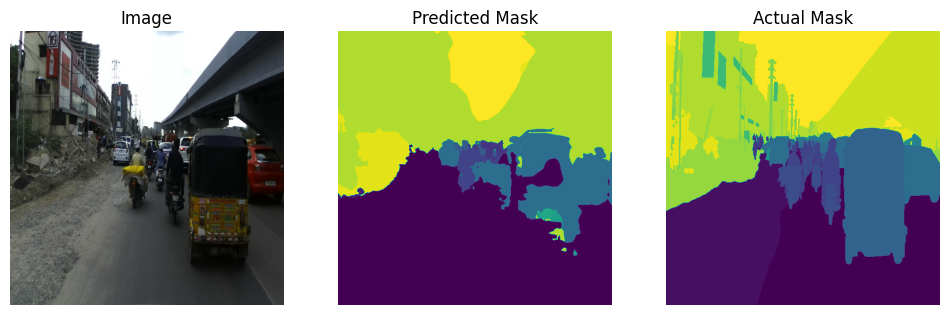

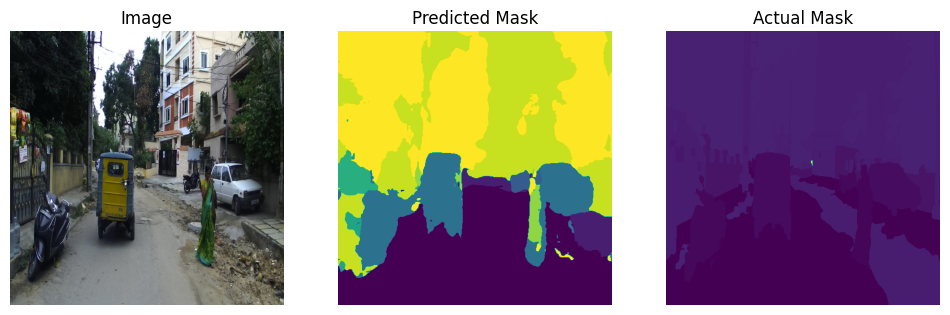

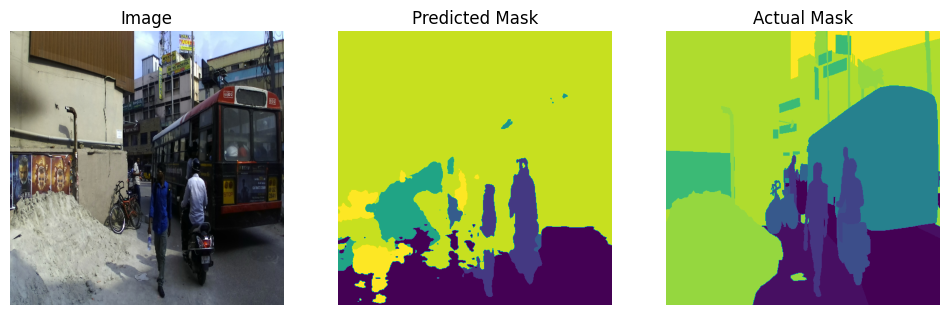

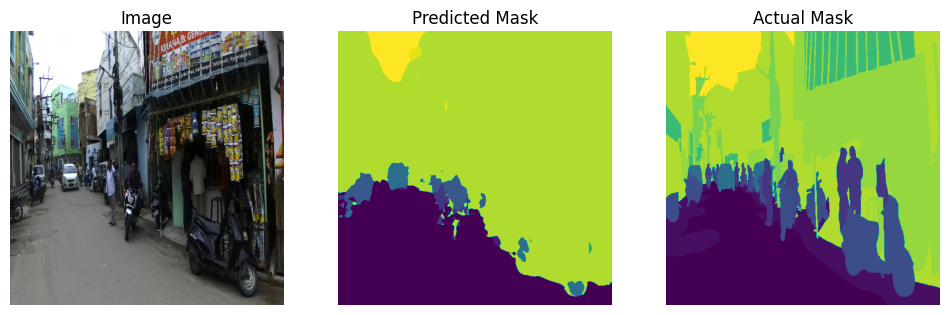

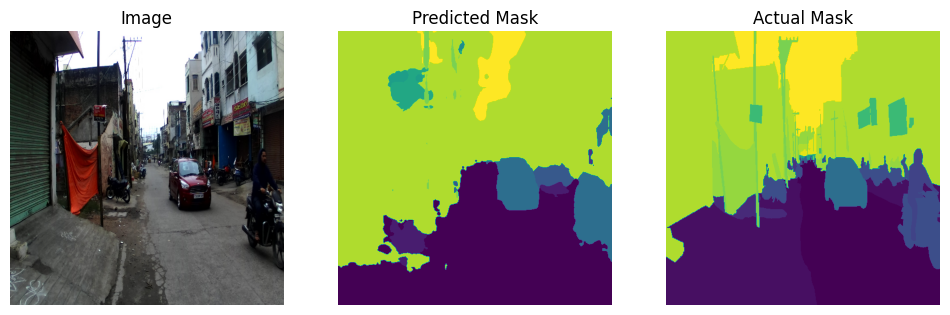

...

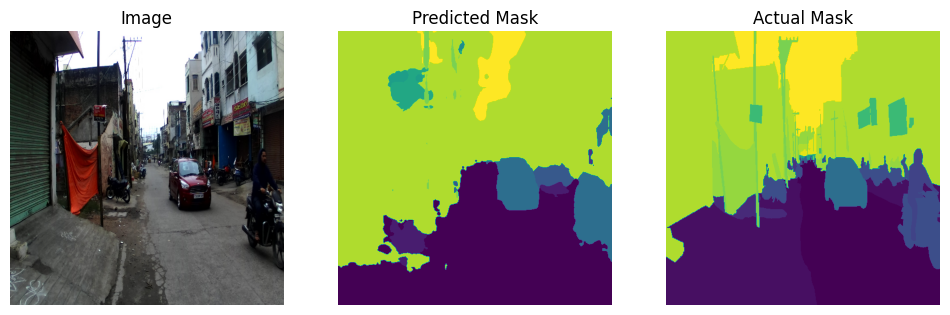

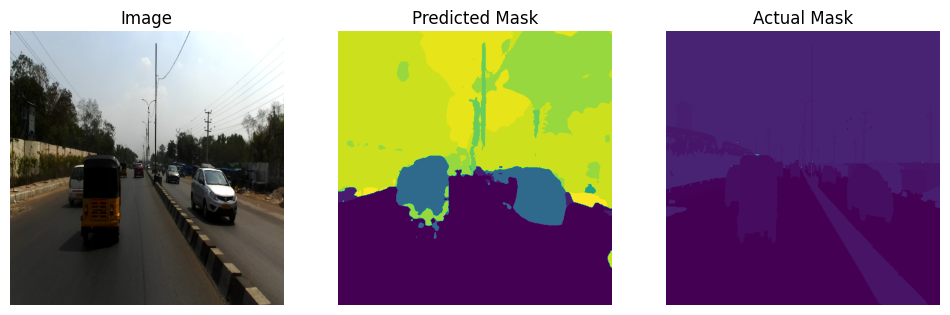

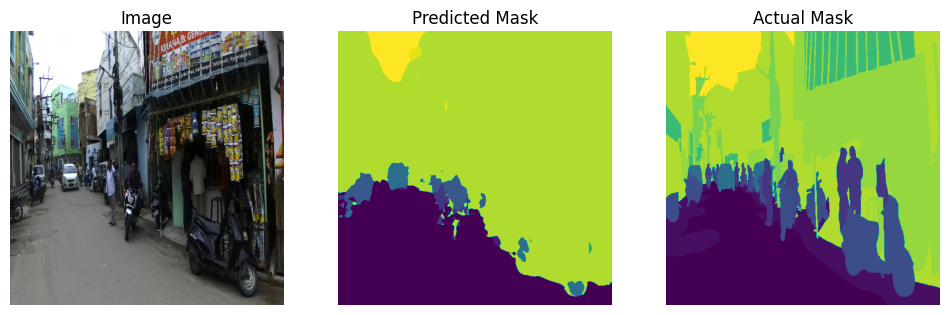

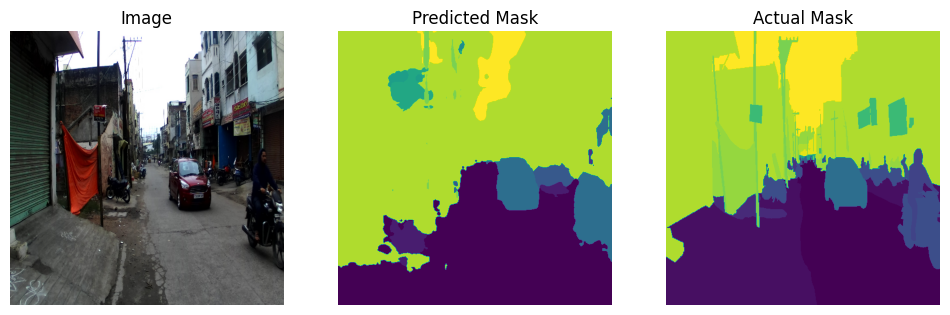

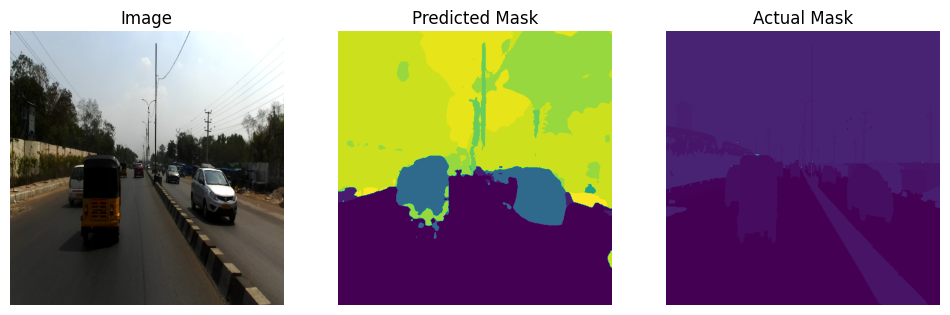

In [ ]:
visualize_low_iou_images(grouped_data)

# 3 3 a) Creating confusion matrix and heatmap

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def create_confusion_matrix(grouped_data, num_classes):
    confusion_matrix = np.zeros((num_classes, num_classes), dtype=np.int32)

    for predicted_mask_path, _, actual_mask_path in grouped_data:
        predicted_mask = np.load(predicted_mask_path)
        actual_mask = cv2.imread(actual_mask_path, cv2.IMREAD_GRAYSCALE)
        actual_mask = cv2.resize(actual_mask, (512, 512), interpolation=cv2.INTER_NEAREST)

        for i in range(num_classes):
            for j in range(num_classes):
                confusion_matrix[i, j] += np.sum((actual_mask == i) & (predicted_mask == j))

    return confusion_matrix




num_classes = len(available_classes)
confusion_matrix = create_confusion_matrix(grouped_data, num_classes)



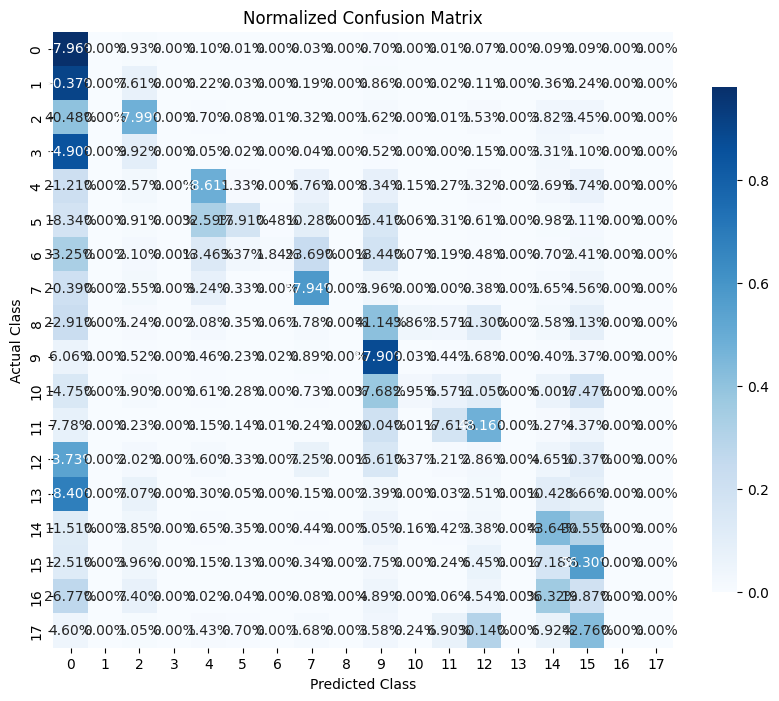

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def visualize_confusion_matrix(confusion_matrix):
    # Normalize the confusion matrix by the number of samples in each class (rows)
    with np.errstate(all='ignore'):  # Ignore division by zero
        normalized_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
        normalized_confusion_matrix = np.nan_to_num(normalized_confusion_matrix)  # Convert NaN to 0

    plt.figure(figsize=(10, 8))
    sns.heatmap(normalized_confusion_matrix, annot=True, fmt='.2%', cmap='Blues', cbar_kws={"shrink": .82})
    plt.xlabel('Predicted Class')
    plt.ylabel('Actual Class')
    plt.title('Normalized Confusion Matrix')
    plt.show()


visualize_confusion_matrix(confusion_matrix)

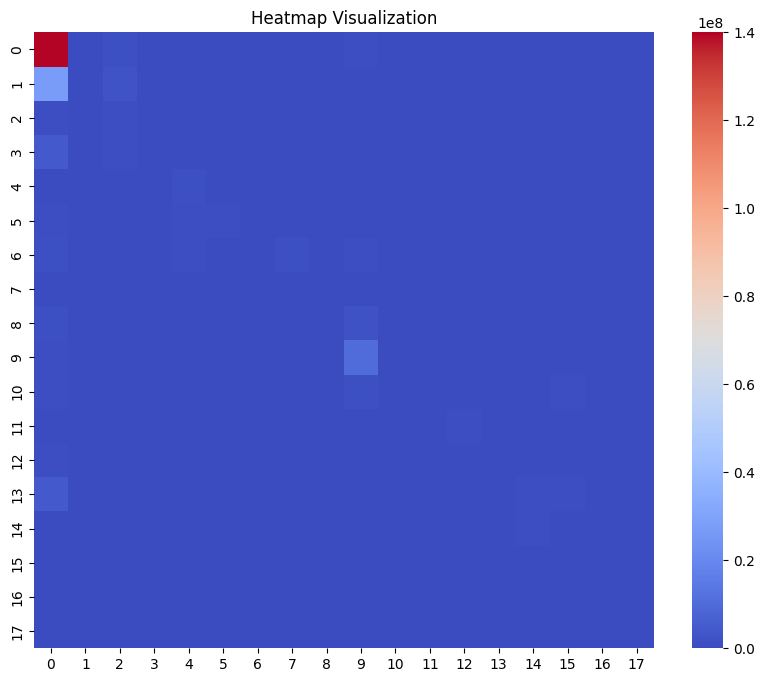

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix, cmap='coolwarm')
plt.title('Heatmap Visualization')
plt.show()

# 3 3 b) Analyzing Performance Metrics

In [ ]:
def calculate_performance_metrics(confusion_matrix):
    num_classes = confusion_matrix.shape[0]
    precision = np.zeros(num_classes)
    recall = np.zeros(num_classes)
    f1_score = np.zeros(num_classes)

    for i in range(num_classes):
        tp = confusion_matrix[i, i]
        fp = np.sum(confusion_matrix[:, i]) - tp
        fn = np.sum(confusion_matrix[i, :]) - tp

        precision[i] = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall[i] = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1_score[i] = 2 * precision[i] * recall[i] / (precision[i] + recall[i]) if (precision[i] + recall[i]) > 0 else 0

    return precision, recall, f1_score

def analyze_performance(precision, recall, f1_score, class_names):
    print("Class-wise Performance Metrics:")
    for i, class_name in enumerate(class_names):
        print(f"Class {class_name}: Precision: {precision[i]:.2f}, Recall: {recall[i]:.2f}, F1 Score: {f1_score[i]:.2f}")

    # Identify well-performing and underperforming classes
    well_performing_classes = [class_names[i] for i in np.where(f1_score >= 0.8)[0]]
    underperforming_classes = [class_names[i] for i in np.where(f1_score < 0.8)[0]]

    print("\nWell-performing Classes:", well_performing_classes)
    print("Underperforming Classes:", underperforming_classes)

# Example usage
class_names = [f"Class {i}" for i in range(num_classes)]
precision, recall, f1_score = calculate_performance_metrics(confusion_matrix)
analyze_performance(precision, recall, f1_score, class_names)



Class-wise Performance Metrics:
Class Class 0: Precision: 0.76, Recall: 0.98, F1 Score: 0.86
Class Class 1: Precision: 0.00, Recall: 0.00, F1 Score: 0.00
Class Class 2: Precision: 0.13, Recall: 0.48, F1 Score: 0.20
Class Class 3: Precision: 0.00, Recall: 0.00, F1 Score: 0.00
Class Class 4: Precision: 0.36, Recall: 0.49, F1 Score: 0.41
Class Class 5: Precision: 0.65, Recall: 0.18, F1 Score: 0.28
Class Class 6: Precision: 0.77, Recall: 0.02, F1 Score: 0.04
Class Class 7: Precision: 0.03, Recall: 0.58, F1 Score: 0.05
Class Class 8: Precision: 0.00, Recall: 0.00, F1 Score: 0.00
Class Class 9: Precision: 0.59, Recall: 0.88, F1 Score: 0.70
Class Class 10: Precision: 0.35, Recall: 0.03, F1 Score: 0.05
Class Class 11: Precision: 0.41, Recall: 0.18, F1 Score: 0.25
Class Class 12: Precision: 0.01, Recall: 0.03, F1 Score: 0.02
Class Class 13: Precision: 0.00, Recall: 0.00, F1 Score: 0.00
Class Class 14: Precision: 0.25, Recall: 0.44, F1 Score: 0.32
Class Class 15: Precision: 0.11, Recall: 0.56, F